# Step 1: Setting Up the Environment

Mount the Google Drive.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Install the necessary libraries that we require for our processes.

In [ ]:
!pip install PyPDF2
!pip install pdf2image
!sudo apt-get install tesseract-ocr
!apt-get install poppler-utils
!apt-get install tesseract-ocr
!pip install pdf2image pytesseract
!pip install pytesseract
!pip install PyMuPDF

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 4.3 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (5,333 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program i

Import Necessary Libraries

In [ ]:
import PyPDF2
from PIL import Image
from pdf2image import convert_from_path
import pytesseract
import re
import fitz  # PyMuPDF
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files
import os
import pickle

# Step 2: Scanning the Main Large PDF Containing Multiple Documents

Import and display to ensure this is the correct document.

In [ ]:
pdf_path = "/content/drive/MyDrive/Zitles/Task 01/Sample Full Search 4.pdf"  # Path to PDF file

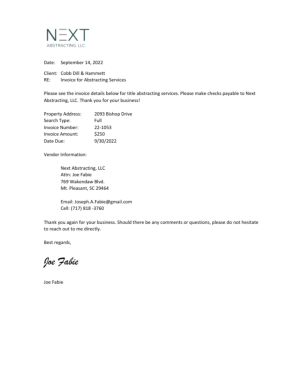

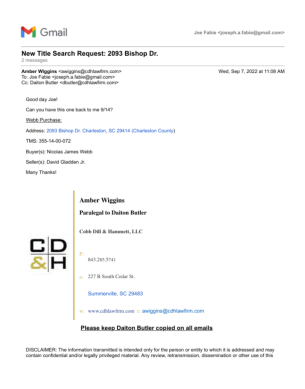

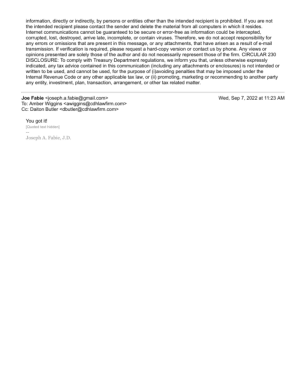

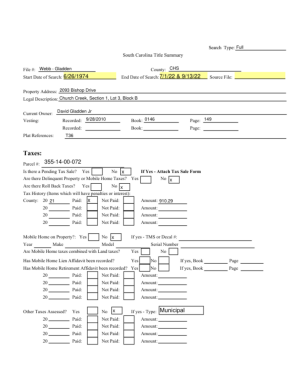

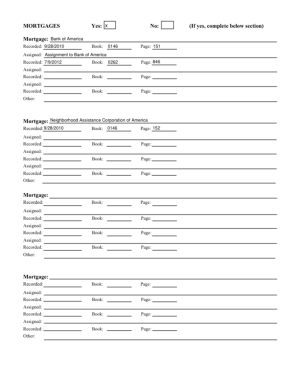

In [ ]:
def display_pdf_range(pdf_path, start_page, end_page):
    doc = fitz.open(pdf_path)
    for page_num in range(start_page - 1, end_page):  # Adjust for 0-based indexing
        page = doc.load_page(page_num)
        pix = page.get_pixmap()
        img = np.frombuffer(pix.samples, dtype=np.uint8).reshape(pix.h, pix.w, pix.n)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# Adjust this as Needed
start_page = 1
end_page = 5
display_pdf_range(pdf_path, start_page, end_page)

Scan and Create Dictionary for Each Pages (OCR and Hand Written text with Tessaract)  |  Use Start and End Page to Scan part of The Document

In [ ]:
def ocr_pdf(pdf_path, start_page, end_page):
    page_content = {}  # Initialize page_content dictionary
    for page_num in range(start_page, end_page + 1):
        images = convert_from_path(pdf_path, first_page=page_num, last_page=page_num)
        for i, image in enumerate(images, start=1):
            # Perform OCR using Tesseract for printed text
            printed_text = pytesseract.image_to_string(image)
            # Perform OCR using Tesseract for handwritten text (experimental)
            handwritten_text = pytesseract.image_to_string(image, config='--oem 1 --psm 13')
            # Combine the printed and handwritten text
            combined_text = f'(Printed Text):\n{printed_text}\n\n(Handwritten Text):\n{handwritten_text}\n\n'
            page_number = f"Page {page_num}"
            page_content[page_number] = combined_text  # Assign page content to page number
            print(page_number, "is Scanning..")
    return page_content

start_page = 1
end_page = 121  # Adjust this as needed
page_content = ocr_pdf('/content/drive/MyDrive/Zitles/Task 01/Sample Full Search 4.pdf', start_page, end_page)

# Print page content
# for page, content in page_content.items():
#     print(f'{page}: {content}\n')

print("\nAll Pages Scanned Succesfully!")

Page 1 is Scanning..
Page 2 is Scanning..
Page 3 is Scanning..
Page 4 is Scanning..
Page 5 is Scanning..
Page 6 is Scanning..
Page 7 is Scanning..
Page 8 is Scanning..
Page 9 is Scanning..
Page 10 is Scanning..
Page 11 is Scanning..
Page 12 is Scanning..
Page 13 is Scanning..
Page 14 is Scanning..
Page 15 is Scanning..
Page 16 is Scanning..
Page 17 is Scanning..
Page 18 is Scanning..
Page 19 is Scanning..
Page 20 is Scanning..
Page 21 is Scanning..
Page 22 is Scanning..
Page 23 is Scanning..
Page 24 is Scanning..
Page 25 is Scanning..
Page 26 is Scanning..
Page 27 is Scanning..
Page 28 is Scanning..
Page 29 is Scanning..
Page 30 is Scanning..
Page 31 is Scanning..
Page 32 is Scanning..
Page 33 is Scanning..
Page 34 is Scanning..
Page 35 is Scanning..
Page 36 is Scanning..
Page 37 is Scanning..
Page 38 is Scanning..
Page 39 is Scanning..
Page 40 is Scanning..
Page 41 is Scanning..
Page 42 is Scanning..
Page 43 is Scanning..
Page 44 is Scanning..
Page 45 is Scanning..
Page 46 is Scanning

# Save Scanned Document in Google Drive (This is for Model Building)

Save the dictionary of scanned document content in Google Drive as a PKL file. This allows us to reuse the pre-scanned dictionary for operations whenever needed.

In [18]:
# Specify the file path for saving the page_content dictionary
save_path = '/content/drive/MyDrive/Zitles/Task 01/page_content4.pkl' #Change the file name acording to scanned document

# Save page_content to the specified file path
with open(save_path, 'wb') as f:
    pickle.dump(page_content, f)

This can be used to load the pre-scanned dictionary of a particular document.

In [37]:
load_path = '/content/drive/MyDrive/Zitles/Task 01/page_content1.pkl' #update as the file name that we need to load

# Load page_content from the file
with open(load_path, 'rb') as f:
    page_content = pickle.load(f)

In [38]:
print(page_content)

{'Page 1': '(Printed Text):\nN=XT\n\nABSTRACTING, LLC\n\nDate: September 15, 2022\n\nClient: Nelson Galbreath\nRE: Invoice for Abstracting Services\n\nPlease see the invoice details below for title abstracting services. Please make checks payable to Next\nAbstracting, LLC. Thank you for your business!\n\nClient Matter: 3242935\nProperty Address: 2224 Skyler Drive\nSearch Type: Up from policy\nInvoice Number: 22-1055\n\nInvoice Amount: $125\n\nDate Due: 9/30/2022\n\nVendor Information:\nNext Abstracting, LLC\nAttn: Joe Fabie\n769 Wakendaw Blvd.\nMt. Pleasant, SC 29464\n\nEmail: Joseph.A.Fabie@gmail.com\nCell: (717) 818 -3760\n\nThank you again for your business. Should there be any comments or questions, please do not hesitate\nto reach out to me directly.\n\nBest regards,\n\nfoe Fabte\n\nJoe Fabie\n\x0c\n\n(Handwritten Text):\n=\n\x0c\n\n', 'Page 2': '(Printed Text):\nRealTitle of the Carolinas, LLC\n\nTitle Search Order Form - File Number: 3242935\nCloser: Marina Oliveira\nDate Ordere

# Step 3: Data Preparation

Identify each document separately and store their start and end page numbers.

In [39]:
def find_document_boundaries(page_content, keywords):
    document_boundaries = {}
    start_page = int(list(page_content.keys())[0].split()[1])  # Extract page number from the first key

    for page, content in page_content.items():
        # Check if any of the keywords are present in the page content
        for keyword in keywords:
            if keyword in content:
                # Store the start and end pages for the current document
                document_boundaries[f"Document_{len(document_boundaries) + 1}"] = (start_page, int(page.split()[1]))

                # Start a new document
                start_page = int(page.split()[1]) + 1  # Start from the next page

                break  # Move to the next page

        # Stop iterating if it's the last page
        if page == list(page_content.keys())[-1]:
            break

    return document_boundaries

# Specify the keywords to identify document boundaries
keywords = ["RECORDER'S PAGE", "DocType", "Doc Type",]

# Find document boundaries
document_boundaries = find_document_boundaries(page_content, keywords)

# Print the start and end pages for each document
for document, (start_page, end_page) in document_boundaries.items():
    print(f"{document}: Start Page - {start_page}, End Page - {end_page}")

Document_1: Start Page - 1, End Page - 30
Document_2: Start Page - 31, End Page - 52
Document_3: Start Page - 53, End Page - 58
Document_4: Start Page - 59, End Page - 59
Document_5: Start Page - 60, End Page - 65
Document_6: Start Page - 66, End Page - 67
Document_7: Start Page - 68, End Page - 74
Document_8: Start Page - 75, End Page - 159
Document_9: Start Page - 160, End Page - 165
Document_10: Start Page - 166, End Page - 169
Document_11: Start Page - 170, End Page - 173
Document_12: Start Page - 174, End Page - 177
Document_13: Start Page - 178, End Page - 195
Document_14: Start Page - 196, End Page - 199
Document_15: Start Page - 200, End Page - 225
Document_16: Start Page - 226, End Page - 229
Document_17: Start Page - 230, End Page - 233
Document_18: Start Page - 234, End Page - 239
Document_19: Start Page - 240, End Page - 247
Document_20: Start Page - 248, End Page - 253
Document_21: Start Page - 254, End Page - 258
Document_22: Start Page - 259, End Page - 261
Document_23: 

Display each document separately, truncating the content to verify its content.

In [40]:
document_content = {}  # Initialize dictionary to store document content

# Iterate through document boundaries
for i, (document, (start_page, end_page)) in enumerate(document_boundaries.items(), start=1):
    content = ""  # Initialize content for the document
    # Iterate through pages between start and end pages (inclusive)
    for page_num in range(start_page, end_page + 1):
        page_key = f"Page {page_num}"
        # Check if the page exists in the page_content dictionary
        if page_key in page_content:
            # Append page content to document content
            content += page_content[page_key] + "\n\n"  # Add a new line between pages
    # Store document content in the document_content dictionary with page range in key
    document_key = f"Document_{i:02d} ----------------------- (Pages {start_page} to {end_page})\n"
    document_content[document_key] = content.strip()  # Strip leading/trailing whitespace

# Print document content along with page range for verification
for document, content in document_content.items():
    print(f"{document}\n{content[:100]}... (truncated for display)\n")

Document_01 ----------------------- (Pages 1 to 30)

(Printed Text):
N=XT

ABSTRACTING, LLC

Date: September 15, 2022

Client: Nelson Galbreath
RE: Invoi... (truncated for display)

Document_02 ----------------------- (Pages 31 to 52)

(Printed Text):
 

LAN
BP1089306 22

RECORDING REQUESTED BY
Ronald Grilli

AND WHEN RECORDED MAIL TO... (truncated for display)

Document_03 ----------------------- (Pages 53 to 58)

(Printed Text):
: **re-recording to correct scriveners error for name
3 . as Grantee**

 

Recorded ... (truncated for display)

Document_04 ----------------------- (Pages 59 to 59)

(Printed Text):
RECORDER'S PAGE

NOTE: This page MUST remain
with the original document

Filed By:

... (truncated for display)

Document_05 ----------------------- (Pages 60 to 65)

(Printed Text):
Recorded by and to be

 

 

returned to:

ee es

STATE OF SOUTH CAROLINA ) TITLE TO... (truncated for display)

Document_06 ----------------------- (Pages 66 to 67)

(Printed Text):
ai ee
=» TMI SS


# Step 4: Find Deed Documents

Identify deed documents separately and print which documents are deeds and which documents are other types.

In [41]:
def find_deed_documents(page_content, document_boundaries):
    deed_documents = []
    other_documents = []

    deed_keywords_newer = ['TITLE TO REAL ESTATE', 'Quitclaim Deed', 'Special Warranty Deed', 'Warranty Deed', 'Indenture', 'conveyance', 'Conveyance']
    deed_phrases_older = ['do grant, bargain, sell, and release', 'do grant and convey']

    for document, (start_page, end_page) in document_boundaries.items():
        is_deed_document = False  # Initialize flag to track if document is a deed document

        # Iterate through pages within the document boundaries
        for page_num in range(start_page, end_page + 1):
            page_key = f"Page {page_num}"
            if page_key in page_content:
                content = page_content[page_key]
                # Check for newer deed keywords
                for keyword in deed_keywords_newer:
                    if keyword.lower() in content.lower():
                        deed_documents.append(document)
                        is_deed_document = True
                        break
                if is_deed_document:
                    break  # If deed document found, move to next document
                # Check for older deed phrases if not already identified as deed document
                for phrase in deed_phrases_older:
                    if re.search(phrase, content, re.IGNORECASE):
                        deed_documents.append(document)
                        is_deed_document = True
                        break
                if is_deed_document:
                    break  # If deed document found, move to next document

        # If the document is not identified as a deed document, add it to other_documents list
        if not is_deed_document:
            other_documents.append(document)

    return deed_documents, other_documents

# Example usage:
deed_documents, other_documents = find_deed_documents(page_content, document_boundaries)

# Print list of deed documents and other documents
print("Deed Documents:", deed_documents)
print("Other Documents:", other_documents)

Deed Documents: ['Document_1', 'Document_3', 'Document_5', 'Document_7', 'Document_8', 'Document_10', 'Document_20']
Other Documents: ['Document_2', 'Document_4', 'Document_6', 'Document_9', 'Document_11', 'Document_12', 'Document_13', 'Document_14', 'Document_15', 'Document_16', 'Document_17', 'Document_18', 'Document_19', 'Document_21', 'Document_22', 'Document_23', 'Document_24']


Separates the content of documents into two groups: deeds and others. It collects all the text belonging to each document, then puts the text of deed documents into one dictionary and the text of other documents into another. Finally, it prints out these separated documents for us to see.

In [31]:
deed_document_content = {}
other_document_content = {}

# Iterate through page_content to populate deed_document_content and other_document_content
for document, (start_page, end_page) in document_boundaries.items():
    # Initialize content string for each document
    document_content = ""

    # Aggregate content of all pages belonging to the document
    for page_num in range(start_page, end_page + 1):
        page_key = f"Page {page_num}"
        if page_key in page_content:
            document_content += page_content[page_key] + "\n"  # Concatenate content of each page

    # Assign the aggregated content to the corresponding document dictionary
    if document in deed_documents:
        deed_document_content[document] = document_content
    elif document in other_documents:
        other_document_content[document] = document_content

print(deed_document_content)
print(other_document_content)

{'Document_1': '(Printed Text):\nN=XT\n\nABSTRACTING, LLC\n\nDate: September 15, 2022\n\nClient: Nelson Galbreath\nRE: Invoice for Abstracting Services\n\nPlease see the invoice details below for title abstracting services. Please make checks payable to Next\nAbstracting, LLC. Thank you for your business!\n\nClient Matter: 3242935\nProperty Address: 2224 Skyler Drive\nSearch Type: Up from policy\nInvoice Number: 22-1055\n\nInvoice Amount: $125\n\nDate Due: 9/30/2022\n\nVendor Information:\nNext Abstracting, LLC\nAttn: Joe Fabie\n769 Wakendaw Blvd.\nMt. Pleasant, SC 29464\n\nEmail: Joseph.A.Fabie@gmail.com\nCell: (717) 818 -3760\n\nThank you again for your business. Should there be any comments or questions, please do not hesitate\nto reach out to me directly.\n\nBest regards,\n\nfoe Fabte\n\nJoe Fabie\n\x0c\n\n(Handwritten Text):\n=\n\x0c\n\n\n(Printed Text):\nRealTitle of the Carolinas, LLC\n\nTitle Search Order Form - File Number: 3242935\nCloser: Marina Oliveira\nDate Ordered: Septe

Store all the deed and other document content dictionaries as separate PKL files in Google Drive. This data will be required for training a model for classification.

In [ ]:
# Define the directory paths for saving the dictionaries
deed_documents_dir = '/content/drive/MyDrive/Zitles/Task 01/Deed_Documents_Train'
other_documents_dir = '/content/drive/MyDrive/Zitles/Task 01/Other_Documents_Train'

# Check if the directories exist, if not, create them
os.makedirs(deed_documents_dir, exist_ok=True)
os.makedirs(other_documents_dir, exist_ok=True)

# Save deed_document_content dictionary
with open(os.path.join(deed_documents_dir, 'deed_documents4.pkl'), 'wb') as f: #Change the name of PKL file to align with the scanned document
    pickle.dump(deed_document_content, f)

# Save other_document_content dictionary
with open(os.path.join(other_documents_dir, 'other_documents4.pkl'), 'wb') as f: #Change the name of PKL file to align with the scanned document
    pickle.dump(other_document_content, f)

print("Deed documents saved to:", deed_documents_dir)
print("Other documents saved to:", other_documents_dir)

Deed documents saved to: /content/drive/MyDrive/Zitles/Task 01/Deed_Documents_Train
Other documents saved to: /content/drive/MyDrive/Zitles/Task 01/Other_Documents_Train


Display Start and End Pages of Only Deeds

In [42]:
# Display page range for each deed document
for deed_document in deed_documents:
    if deed_document in document_boundaries:
        start_page, end_page = document_boundaries[deed_document]
        print(f"Deed {deed_document}: Start Page - {start_page}, End Page - {end_page}")

Deed Document_1: Start Page - 1, End Page - 30
Deed Document_3: Start Page - 53, End Page - 58
Deed Document_5: Start Page - 60, End Page - 65
Deed Document_7: Start Page - 68, End Page - 74
Deed Document_8: Start Page - 75, End Page - 159
Deed Document_10: Start Page - 166, End Page - 169
Deed Document_20: Start Page - 248, End Page - 253


# Step 5: Explore Deed Books and Page Numbers Using Regex

Iterates through the document boundaries to find the end page of each document. Then, it searches for matches of book and page numbers using a regular expression pattern. The extracted book and page numbers are stored in a list.

In [43]:
def extract_book_and_page_numbers(page_content, document_boundaries):
    book_page_numbers = []

    # Define a regex pattern to match Book and Page numbers
    pattern = r'\b(\d{4})\b.*?\b(\d{3})\b'

    # Iterate through document boundaries to extract end pages for deed documents
    for document, (_, end_page) in document_boundaries.items():
        # Ensure the end page exists in the page_content dictionary
        if f"Page {end_page}" in page_content:
            content = page_content[f"Page {end_page}"]
            # Search for matches using the regex pattern
            matches = re.findall(pattern, content)
            print(f"Matches found on End Page of {document}: {matches}")

            # Filter out pairs of numbers that match the criteria
            for match in matches:
                book, page = match
                book_page_numbers.append((document, int(book), int(page)))

    return book_page_numbers

# Example usage:
book_page_numbers = extract_book_and_page_numbers(page_content, document_boundaries)

Matches found on End Page of Document_1: [('0956', '168'), ('4800', '101')]
Matches found on End Page of Document_2: [('3404', '204'), ('1089', '306'), ('4800', '101')]
Matches found on End Page of Document_3: [('4800', '101')]
Matches found on End Page of Document_4: [('0674', '904')]
Matches found on End Page of Document_5: [('0616', '483'), ('4800', '101')]
Matches found on End Page of Document_6: [('1545', '983'), ('4800', '101')]
Matches found on End Page of Document_7: [('0390', '873')]
Matches found on End Page of Document_8: [('0303', '380'), ('4800', '101')]
Matches found on End Page of Document_9: [('0507', '585'), ('4800', '101')]
Matches found on End Page of Document_10: [('0547', '388'), ('0393', '380'), ('4800', '101')]
Matches found on End Page of Document_11: [('4800', '101')]
Matches found on End Page of Document_12: [('0591', '700'), ('4800', '101')]
Matches found on End Page of Document_13: [('0618', '193'), ('0618', '193'), ('0393', '380'), ('4800', '101')]
Matches 

Define the labels using Deed Book and Page Number to Store Documents that we have Found. It searches for matches of book and page numbers using a regular expression pattern. If matches are found, it joins the book and page numbers with an underscore and stores them in the deed_info dictionary. If no matches are found, it simply stores the document name itself.

In [44]:
# Initialize dictionary to store deed information
deed_info = {}

# Define a regex pattern to match Book and Page numbers
pattern = r'\b(\d{4})\b.*?\b(\d{3})\b'

# Iterate through document boundaries to extract end pages for deed documents
for document, (_, end_page) in document_boundaries.items():
    # Ensure the end page exists in the page_content dictionary
    if f"Page {end_page}" in page_content:
        content = page_content[f"Page {end_page}"]
        # Search for matches using the regex pattern
        matches = re.findall(pattern, content)

        # Check if matches are found
        if matches:
            # Extract the book and page numbers and join them with underscore
            book_page_info = "_".join(matches[0])
            deed_info[f"Document_{len(deed_info) + 1}"] = book_page_info
        else:
            # If no matches found, add the document name itself
            deed_info[f"Document_{len(deed_info) + 1}"] = document

# Print deed information
for deed, info in deed_info.items():
    print(f"{deed}: {info}")

Document_1: 0956_168
Document_2: 3404_204
Document_3: 4800_101
Document_4: 0674_904
Document_5: 0616_483
Document_6: 1545_983
Document_7: 0390_873
Document_8: 0303_380
Document_9: 0507_585
Document_10: 0547_388
Document_11: 4800_101
Document_12: 0591_700
Document_13: 0618_193
Document_14: 4800_101
Document_15: 4800_101
Document_16: 4800_101
Document_17: 0723_975
Document_18: 4800_101
Document_19: Document_19
Document_20: 4800_101
Document_21: 4800_101
Document_22: 4800_101
Document_23: 0525_180
Document_24: 0140_128


# Step 6: Store Deeds With Lables in Google Drive

In [46]:
#Sequence index out of range Error Fixed!
import PyPDF2
from google.colab import files

def extract_pages(input_pdf_path, output_pdf_path, start_page, end_page):
    with open(input_pdf_path, 'rb') as input_file:
        pdf_reader = PyPDF2.PdfReader(input_file)
        pdf_writer = PyPDF2.PdfWriter()

        # Get the total number of pages in the PDF
        total_pages = len(pdf_reader.pages)

        # Adjust the end page number if it exceeds the total number of pages
        end_page = min(end_page, total_pages)

        # Extract pages
        for page_num in range(start_page - 1, end_page):
            pdf_writer.add_page(pdf_reader.pages[page_num])

        # Write extracted pages to a new PDF file
        with open(output_pdf_path, 'wb') as output_file:
            pdf_writer.write(output_file)

# Iterate through deed documents and extract pages
for i, deed in enumerate(deed_documents, start=1):
    # Check if the deed document exists in the document_boundaries dictionary
    if deed in document_boundaries:
        # Get the start and end page numbers for the deed document
        start_page, end_page = document_boundaries[deed]

        print(f"Deed document {deed} pages: {start_page} - {end_page}")  # Debugging

        # Get the deed info from the deed_info dictionary
        deed_info_value = deed_info[deed]

        # Construct the output filename based on the deed info
        if deed_info_value.startswith("Document"):
            # If the info is the document name, use it directly
            output_filename = f'{deed_info_value}.pdf'
        else:
            # If the info is in the format "book_page", split it and construct the filename
            book, page = deed_info_value.split("_")
            output_filename = f'{book}_{page}.pdf'

        # Construct the input and output file paths
        input_pdf_path = '/content/drive/MyDrive/Zitles/Task 01/Sample Full Search 1.pdf'
        output_pdf_path = f'/content/drive/MyDrive/Zitles/Task 01/split/{output_filename}'

        # Extract pages and save as a new PDF file
        extract_pages(input_pdf_path, output_pdf_path, start_page, end_page)
        print(f"Deed document {deed} extracted and saved as {output_pdf_path}")
    else:
        print(f"Deed document {deed} not found in document boundaries.")

Deed document Document_1 pages: 1 - 30
Deed document Document_1 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/0956_168.pdf
Deed document Document_3 pages: 53 - 58
Deed document Document_3 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/4800_101.pdf
Deed document Document_5 pages: 60 - 65
Deed document Document_5 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/0616_483.pdf
Deed document Document_7 pages: 68 - 74
Deed document Document_7 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/0390_873.pdf
Deed document Document_8 pages: 75 - 159
Deed document Document_8 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/0303_380.pdf
Deed document Document_10 pages: 166 - 169
Deed document Document_10 extracted and saved as /content/drive/MyDrive/Zitles/Task 01/split/0547_388.pdf
Deed document Document_20 pages: 248 - 253
Deed document Document_20 extracted and saved as /content/drive/MyDrive/Zitles/Task

Display All the Documents That we have Saved in Google Drive (Optional)

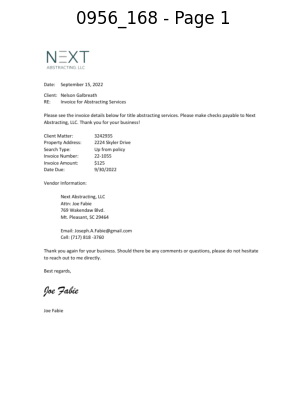

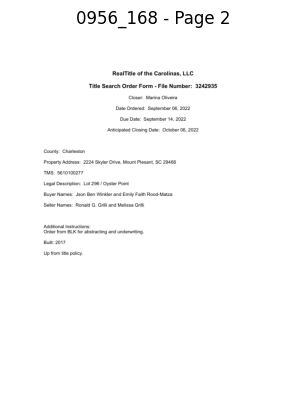

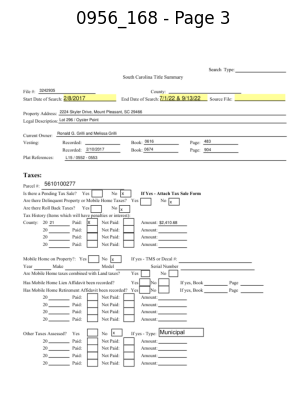

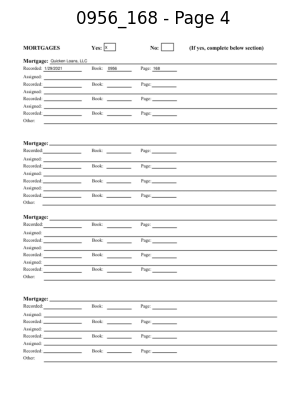

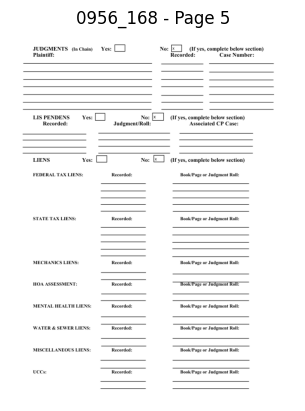

...

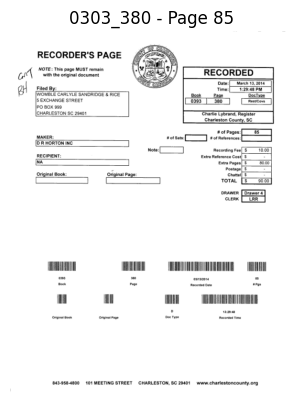

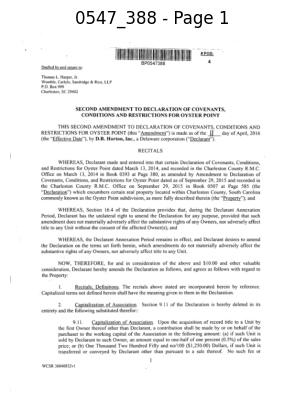

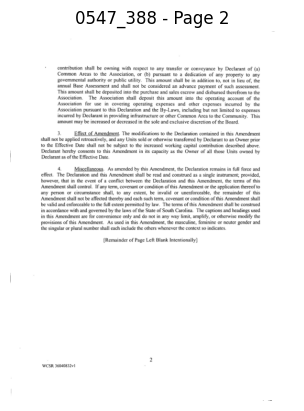

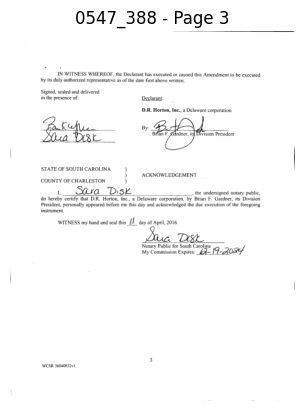

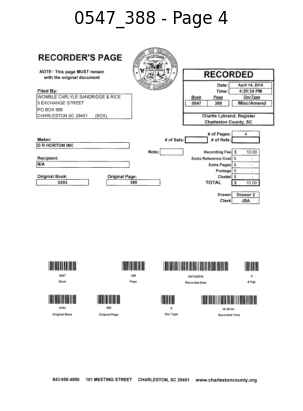

In [47]:
import glob

def display_pdf(pdf_path, label):
    # Open the PDF file
    pdf_document = fitz.open(pdf_path)

    # Display each page of the PDF with a label
    for page_number in range(pdf_document.page_count):
        page = pdf_document.load_page(page_number)
        pix = page.get_pixmap()
        img_data = np.frombuffer(pix.samples, dtype=np.uint8).reshape(pix.h, pix.w, pix.n)
        plt.imshow(img_data)
        plt.title(f'{label} - Page {page_number+1}')
        plt.axis('off')
        plt.show()

# Get a list of all PDF files in the specified directory
pdf_files = glob.glob('/content/drive/MyDrive/Zitles/Task 01/split/*.pdf')

# Display each PDF file with its actual name and label each page with the document name and page number
if pdf_files:
    for pdf_file in pdf_files:
        document_name = os.path.basename(pdf_file)[:-4]  # Extract document name without extension
        display_pdf(pdf_file, document_name)
else:
    print("No PDF files found in the specified directory.")

# End of the Program.